# Doodle Classification
Lab Assignment Two: Exploring Image Data

*Mark Brubaker*

## Business Understanding
This dataset consists of 250 catagories of hand draw doodles, each with 80 images for a total of 20,000 images. I used the .png version of the dataset downloaded here:

http://cybertron.cg.tu-berlin.de/eitz/projects/classifysketch/[http://cybertron.cg.tu-berlin.de/eitz/projects/classifysketch/]

The dataset was originally created for use in a 2012 paper titled "How Do Humans Sketch Objects?" The paper can be found here:

http://cybertron.cg.tu-berlin.de/eitz/pdf/2012_siggraph_classifysketch.pdf[http://cybertron.cg.tu-berlin.de/eitz/pdf/2012_siggraph_classifysketch.pdf]

The catagories of objects elected in the paper were chosen to be as diverse as possible while still being easily recognizable and specific. This would give a broad range of objects covered while hopefully still being able to be easily classified. For the paper a number of requirements were given when the doodles were being drawn. The most general of these was "non-expert". This would help give a better representation on how an average person would draw. Next the drawings had to meet 4 criteria; No external context around the drawing, easily recognizable / distinct, no text labels, and no large filled in areas.

Being able to classify drawing of objects like this could be useful in number of ways. Most directly, this dataset lends itself to a Pictionary style game. Another example could be for identifying individual hieroglyphics. While a classifier for that purpose would need to be built around a dataset of hieroglyphics, many of the techniques used here translate very well to such a dataset as both are line drawings. A final use could be in an image search engine when a user would be shown a list of images that are similar to the one they are searching for.

For the paper a baseline classification was collected from humans. On average the humans were able to correctly classify the doodles 73% of the time. Using a nearest neighbor classifier they were able to get ~38% accuracy and with a binary SVM they were able to get ~53% accuracy.

By itself, the accuracies of the original paper are good goals to shoot for, but each of the listed applications might require either a higher or lower accuracy to be viable. iN A Pictionary game a almost perfect level of accuracy would be required to make the game rely on it. But if applied correctly this would not be needed. For example the computer might pose a topic to draw and the classifier could be used as an AI opponent. Different levels of accuracy would be needed for different levels of difficulty. A beginner level might only require 50% accuracy while an expert level might require 90% accuracy. A hieroglyphic classifier would be very similar to Google Translate which has an accuracy of ~72%. If used in a casual setting like Google Translate often is this would be an appropriate accuracy, but if used in an academic setting, an accuracy closet to 95% would likely be required. Finally, an image search engine would need the lowest accuracy. The goal of an image search engine would not be to find the exact image, but to find images that are similar to the one being searched for. This might even mean showing similar images that are not from the target class at all. For this reason, an accuracy of 50% would likely be acceptable. This low accuracy would further be fine as the user could be shown many images and could easily filter through them themselves.

In [2]:
import pandas as pd
import numpy as np
from PIL import Image
import pickle
import os

LOAD_FROM_PICKLE = True

# get the name of every folder in the Data/Doodles folder and store it in a list
catagories = [f for f in os.listdir('../Data/Doodles_Resized') if not f.startswith('.')]

height = 85
width = 85

# numpy array to store the images
data = np.empty((0, height*width))
target = np.empty((0))

if LOAD_FROM_PICKLE:
    with open('../Data/Pickle/doodle_data.pickle', 'rb') as handle:
        data = pickle.load(handle)
    with open('../Data/Pickle/doodle_target.pickle', 'rb') as handle:
        target = pickle.load(handle)
    print('Loaded data from pickle')
else:
    for idx, catagory in enumerate(catagories):
        # load each png file in the folder
        for idy, filename in enumerate(os.listdir('../Data/Doodles_Resized/' + catagory)):
            # load the image
            im_frame = Image.open('../Data/Doodles_Resized/' + catagory + '/' + filename)

            # convert the image to a numpy array
            im = np.array(im_frame)
            # remove a border of 8 pixels
            # this will still keep a small border around the image
            im = im[8:-8, 8:-8]
            # reshape the image to a 1D array
            im = im.reshape(1, -1)

            # add the image to the data array
            data = np.append(data, im, axis=0)
            # add the catagory to the target array
            target = np.append(target, [idx], axis=0,)
        
        print(str(idx + 1) + '. Finished loading catagory: ' + catagory)

    with open('../Data/Pickle/doodle_data.pickle', 'wb') as handle:
        pickle.dump(data, handle, protocol=pickle.HIGHEST_PROTOCOL)
    with open('../Data/Pickle/doodle_target.pickle', 'wb') as handle:
        pickle.dump(target, handle, protocol=pickle.HIGHEST_PROTOCOL)



Loaded data from pickle


First the data is loaded in. The original dataset had 250 catagories each with 80 1111x1111 images. I reduced the number of catagories by 100 down to a new total of 150. This was done to reduce computation times and give any attempts at classification a slightly higher chance. The process of selecting which catagories to remove was very unscientific, where I just removed ones I thought were uninteresting. The list of catagories can be vaguely broken down in to subcategories, for example, animals, vehicles, or household items. When removing catagories I tried to entirely remove subcategories I had already removed a large number of doodles from. Two catagories I entirely removed were weapons and furniture. 

Not seen in the code above, I initially read in all the full sized images and resized them to 1/11 the original size or 101 x 101. I selected the 1/11 scale because 11 and 101 are the only factors of 1111 so this size would evenly shrink the images. Further, every image had a boarder of at least 10 on all sides. Most of the boarder was removed because the data for the boarder was the same across every image and would not be useful.

No color conversion was needed as the dataset was already in grey scale with 0 as black and 255 as white.

In [3]:
n_samples, n_features = data.shape
n_classes = len(catagories)

Here some basic information about the data is stored in convenient variables

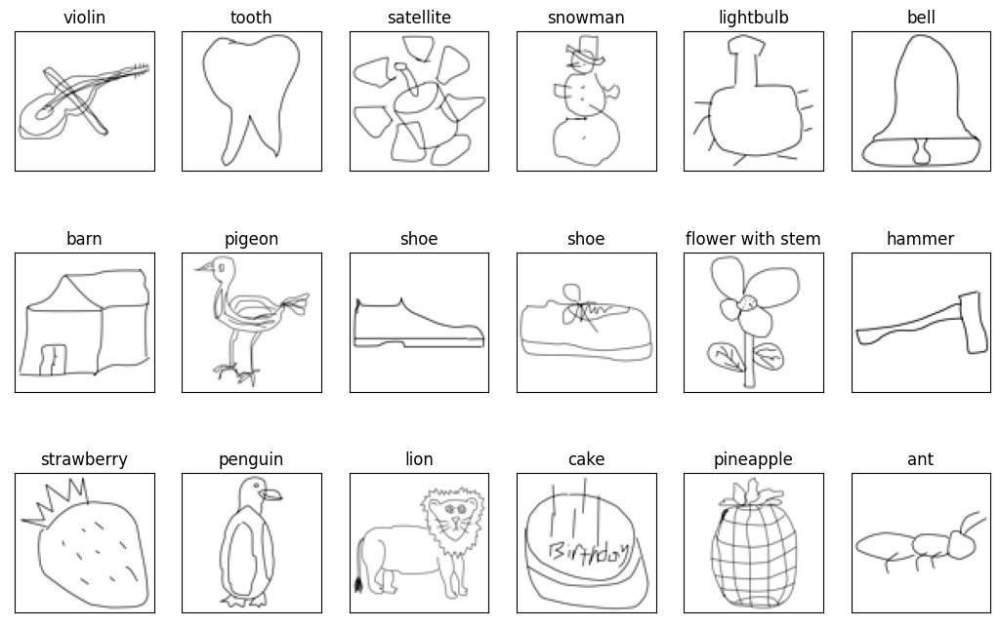

In [10]:
import matplotlib.pyplot as plt

# helper plotting functions
def plot_gallery(images, titles, h, w, n_row=3, n_col=6):
    """Helper function to plot a gallery of portraits"""
    plt.figure(figsize=(1.7 * n_col, 2.3 * n_row))
    plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)
    for i in range(n_row * n_col):
        plt.subplot(n_row, n_col, i + 1)
        plt.imshow(images[i].reshape((h, w)), cmap=plt.cm.gray)
        plt.title(titles[i], size=12)
        plt.xticks(())
        plt.yticks(())

def plot_random_gallery(images, labels, titles, h, w, n_row=3, n_col=6):
    """Helper function to plot a gallery of portraits"""
    plt.figure(figsize=(1.7 * n_col, 2.3 * n_row))
    plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)
    for i in range(n_row * n_col):
        # get random image
        rand = np.random.randint(0, len(images))
        plt.subplot(n_row, n_col, i + 1)
        plt.imshow(images[rand].reshape((h, w)), cmap=plt.cm.gray)
        plt.title(titles[int(labels[rand])], size=12)
        plt.xticks(())
        plt.yticks(())

plot_random_gallery(data, target, catagories, height, width) # defaults to showing a 3 by 6 subset of the faces

In order to get a good feel for the dataset 18 random images are displayed here. This also shows the diversity of catagories in the dataset, as well as some of the aforementioned subcategories, the largest of which is animals. All of the images are in this style of thin lines on a white background. In some of the above images the remaining boarder of ~3 pixels can be seen.

In [37]:
def plot_explained_variance(pca):
    import plotly
    from plotly.graph_objs import Bar, Line
    from plotly.graph_objs import Scatter, Layout
    from plotly.graph_objs.scatter import Marker
    from plotly.graph_objs.layout import XAxis, YAxis
    plotly.offline.init_notebook_mode() # run at the start of every notebook
    
    explained_var = pca.explained_variance_ratio_
    cum_var_exp = np.cumsum(explained_var)
    
    plotly.offline.iplot({
        "data": [Bar(y=explained_var, name='individual explained variance'),
                 Scatter(y=cum_var_exp, name='cumulative explained variance')
            ],
        "layout": Layout(xaxis=XAxis(title='Principal components'), yaxis=YAxis(title='Explained variance ratio'), title='Explained variance by principal components. Total Explained Variance by ' + str(len(explained_var)) + ' compoents: ' + str(cum_var_exp[-1] * 100)[0:6] + '%')
    })

This function plots the explained variance of each principal component as well as the cumulative explained variance.

In [39]:
from sklearn.decomposition import PCA

n_components = n_features
print ("Extracting all %d eigendoodles" % (n_components))

pca_full = PCA(n_components=n_components)
%time pca_full.fit(data.copy())
eigendoodles = pca_full.components_.reshape((n_components, height, width))

plot_explained_variance(pca_full)

Extracting all 7225 eigendoodles
CPU times: user 45min 48s, sys: 9min 2s, total: 54min 51s
Wall time: 3min 28s


Above a breakdown of the full PCA can be seen. This helps visualize both how additional components add to the total explained variance and how the cumulative explained variance reaches 100%. In order to get a good representation of the data I wanted to get at least 90% cumulative explained variance. In order to meet this goal around 2400 principal components are needed which is about 1/3 of the total number of components. Getting an almost perfect representation of the data with only 1/3 of the possible components is a significant reduction in features while being able to retain a high amount of image fidelity.

In [41]:
n_components = 2400
print ("Extracting the top %d eigendoodles from %d doodles" % (n_components, data.shape[0]))

pca = PCA(n_components=n_components)
%time pca.fit(data.copy())
eigendoodles = pca.components_.reshape((n_components, height, width))

plot_explained_variance(pca)

Extracting the top 2400 eigendoodles from 11999 doodles
CPU times: user 7min 26s, sys: 1min 48s, total: 9min 14s
Wall time: 36.3 s


Here it can again be seen that 2400 components will achieve just over 90% cumulative explained variance. Another interesting thing to note is the contribution of the first few components. If every component had an equal contribution they would all have an explained variance of 0.008%, however the first component explains 2.7% of the variance. The contribution of each following component quickly petters out, still requiring 2400 components to reach 90% cumulative explained variance. It is possible that if the images were more similar to each other the first few components would have a larger contribution and less would be needed to reach 90% cumulative explained variance.

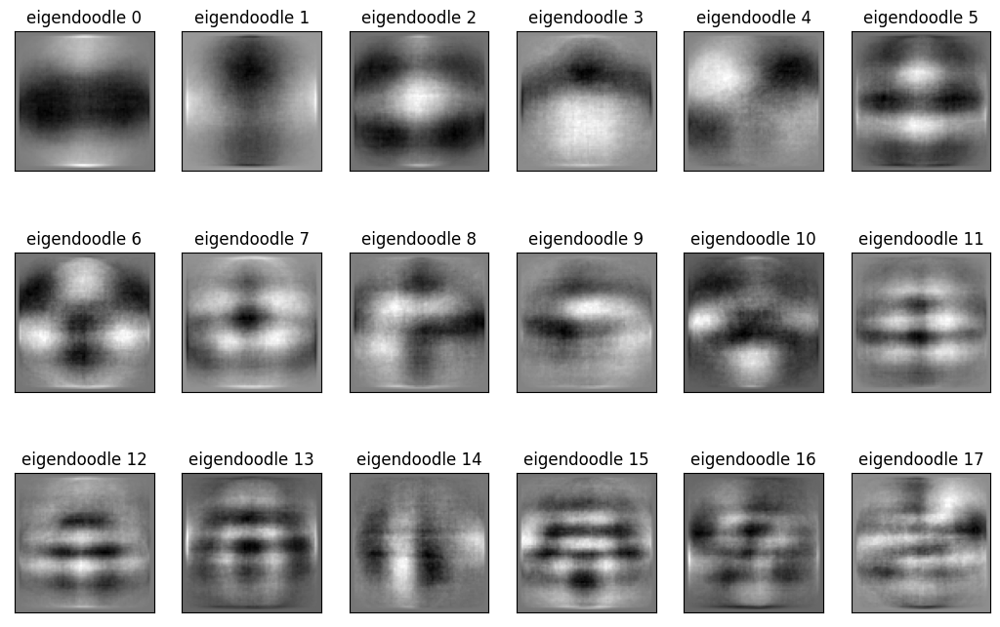

In [ ]:
eigendoodle_titles = ["eigendoodle %d" % i for i in range(eigendoodles.shape[0])]
plot_gallery(eigendoodles, eigendoodle_titles, height, width)

This gallery of the top 18 principal components gives some insight into how the data was reduced. While none of the images are recognizable, this makes sense as there are very few elements that are similar throughout all the doodles. The one elements that is present in every doodle is the boarder and it can be clearly seen in all 18 of the shown eigendoodles.

In [42]:
n_components = 2400
print ("Extracting the top %d eigendoodles from %d doodles" % (n_components, data.shape[0]))

rpca = PCA(n_components=n_components, svd_solver='randomized')
%time rpca.fit(data.copy())
eigendoodles = rpca.components_.reshape((n_components, height, width))

plot_explained_variance(rpca)

Extracting the top 2400 eigendoodles from 11999 doodles
CPU times: user 7min 20s, sys: 2min 3s, total: 9min 24s
Wall time: 36.9 s


Here randomized PCA was used to generate the eigendoodles. 2400 components were also used and the result is a very similar cumulative explained variance of around 90%. Ultimately, the results are very similar to the normal PCA, but importantly the randomized PCA was faster to compute by about 10%.

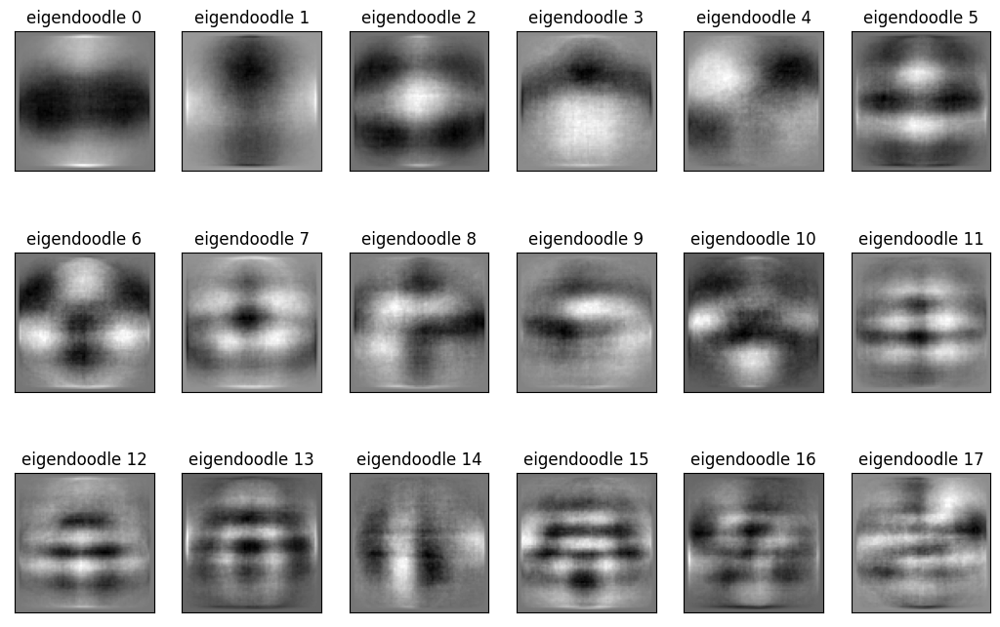

In [ ]:
eigendoodle_titles = ["eigendoodle %d" % i for i in range(eigendoodles.shape[0])]
plot_gallery(eigendoodles, eigendoodle_titles, height, width)

Again, here the top 18 eigendoodles are shown. The results are very similar to the normal PCA with most looking almost identical. The distinct boarder is still present in all of the images.

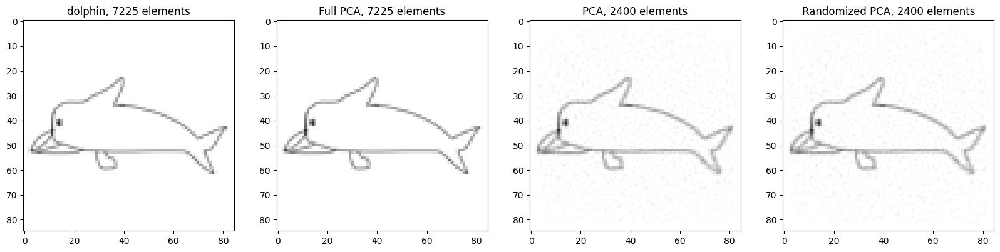

In [65]:
from ipywidgets import widgets
import warnings
# warnings.simplefilter('ignore', DeprecationWarning)
# warnings.simplefilter("always",DeprecationWarning)

def plt_reconstruct(idx_to_reconstruct):
    # this code is for reference only, it does not qualify as a neaarest neighbor search
    #  for your lab project. 
    idx_to_reconstruct = np.round(idx_to_reconstruct)
    
    x_flat = data[idx_to_reconstruct].reshape(1, -1)
    reconstruct_image_full = pca_full.inverse_transform(pca_full.transform(x_flat.copy()))
    reconstructed_image = pca.inverse_transform(pca.transform(x_flat.copy()))    
    reconstructed_image_rpca = rpca.inverse_transform(rpca.transform(x_flat.copy()))
    
    plt.figure(figsize=(20,7))
    
    plt.subplot(1,4,1) # original
    plt.imshow(x_flat.reshape((height, width)), cmap=plt.cm.gray, vmin = 0, vmax = 255)
    plt.title(catagories[int(target[idx_to_reconstruct])]+f", {x_flat.shape[1]} elements")
    plt.grid(False)

    plt.subplot(1,4,2) # full pca
    plt.imshow(reconstruct_image_full.reshape((height, width)), cmap=plt.cm.gray, vmin = 0, vmax = 255)
    plt.title(f"Full PCA, {n_features} elements")
    plt.grid(False)
    
    plt.subplot(1,4,3) # pca
    plt.imshow(reconstructed_image.reshape((height, width)), cmap=plt.cm.gray, vmin = 0, vmax = 255)
    plt.title(f"PCA, {n_components} elements")
    plt.grid(False)
    
    plt.subplot(1,4,4) # randomized pca
    plt.imshow(reconstructed_image_rpca.reshape((height, width)), cmap=plt.cm.gray, vmin = 0, vmax = 255)
    plt.title(f"Randomized PCA, {n_components} elements")
    plt.grid(False)
    
    
    
# widgets.interact(plt_reconstruct,idx_to_reconstruct=(0,n_samples-1,1),__manual=True)

plt_reconstruct(0)

# I could not get the widgets to export properly


Here the various PCA's are used to reconstruct images. The first image is the original. The second is a reconstruction from the full PCA. The third is a reconstruction from the top 2400 of PCA and the final image is the top 2400 components of randomized PCA. The Full reconstruction is used as a reference for how good a reconstruction can be. As we would expect it is essentially the exact same as the original. It's not quite perfect as some floating point precession errors are introduced. How much is introduced is measured later. Both of the partial reconstructions look very similar to each other. They both do a very good job of reconstructing the draw lines and have some noise in the background.

In [44]:
import copy

def closest_image(dmat_pca, idx1, idx):
    distances = copy.deepcopy(dmat_pca[idx,:]) # get all image distances
    distances[idx1] = np.infty # dont pick the same image!
    idx2 = np.argmin(distances) #pca
    
    distances[idx2] = np.infty # dont pick the same image!
    idx3 = np.argmin(distances) # pixels
    
    plt.figure(figsize=(10,16))
    plt.subplot(1,3,1)
    plt.imshow(data[idx1].reshape((height,width)),cmap=plt.cm.gray, vmin = 0, vmax = 255)
    plt.title("Original:"+catagories[int(target[idx1])])
    plt.grid(False)

    plt.subplot(1,3,2)
    plt.imshow(data[idx2].reshape((height,width)),cmap=plt.cm.gray, vmin = 0, vmax = 255)
    plt.title("Closest:"+catagories[int(target[idx2])])
    plt.grid(False)
    
    plt.subplot(1,3,3)
    plt.imshow(data[idx3].reshape((height,width)),cmap=plt.cm.gray, vmin = 0, vmax = 255)
    plt.title("Next Closest:"+catagories[int(target[idx3])])
    plt.grid(False)

This function is used to display the fist and second most similar image to a given image

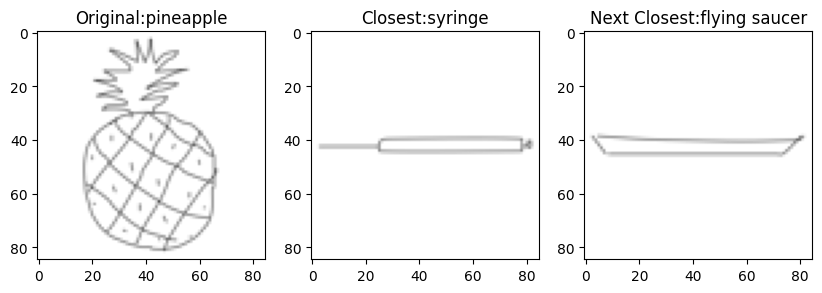

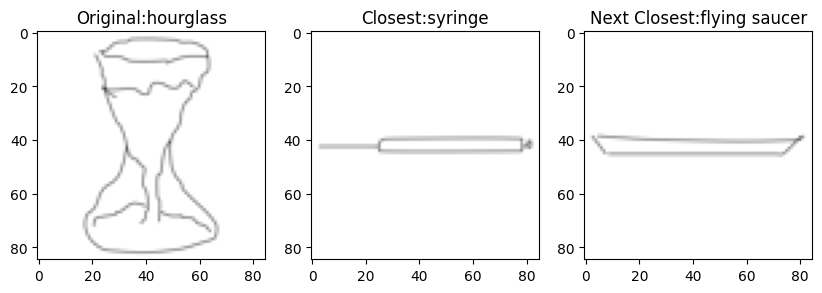

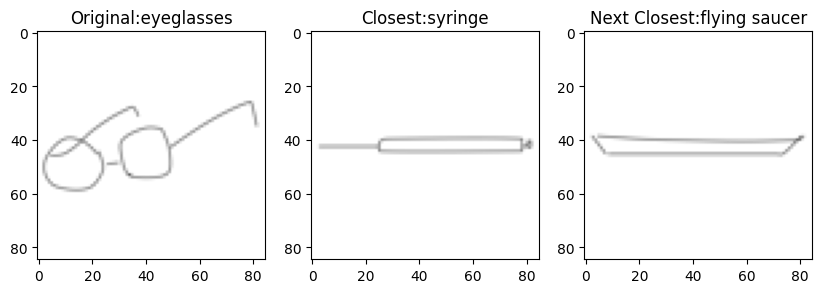

In [45]:
from sklearn.metrics.pairwise import pairwise_distances

# get the reconstruction for the original data
X_rpca_features = rpca.transform(copy.deepcopy(data))

# get three random images and put a copy in a new array
num_doodles = 3
random_idx = np.random.randint(0, data.shape[0], size=num_doodles)
random_data = data[random_idx].copy()

# get the pairwise distance between the random images and all the other images
random_data_rpca_features = rpca.transform(random_data)
dist_matrix_rpca = pairwise_distances(random_data_rpca_features, X_rpca_features, metric="seuclidean", V=None)

# display the random images and their nearest neighbors
for i in range(num_doodles):
    closest_image(dist_matrix_rpca, random_idx[i], i)
    

My fist attempt to quantify how good the reconstructions was going to utilize finding the closest image to the reconstructions by calculating the pairwise distance between the reduced versions of the images. I quickly realized that this would not provide very useful classifications. As the vast majority of every image is whitespace this tends to make images that have lots of white space the closest match to every doodle. This makes sense as it is easier to line up empty space than to find an image where the thin lines match up. Most commonly, very thin item are selected as the closest match like a syringe, pen or toothbrush. At the core of this issue is how the data is composed. As each category there is only 80 images, which is not a large amount. Compounding on this, there is very little consistency within each category of the dataset. With this method if there were two very similar doodles in the same category but one was offset by a few pixels they would probably not even match to each other. This is because PCA is reliant on the similar features of each category appearing in the location in feature space. This dataset is epically poor at maintaining this property. After realizing this I started looking for other approaches to quantify the quality of the reconstructions.

Although all the images shown above are calculated from rPCA the exact same problem occurs with normal PCA.

In [46]:
# reconstruct the images from the pca features
reconstruct_pca_full = pca_full.inverse_transform(pca_full.transform(data.copy()))
reconstruct_pca = pca.inverse_transform(pca.transform(data.copy()))
reconstruct_rpca = rpca.inverse_transform(rpca.transform(data.copy()))

# sum data to get a single value for each image
sum_data = np.sum(data,axis=1)
sum_pca_full = np.sum(reconstruct_pca_full,axis=1)
sum_pca = np.sum(reconstruct_pca,axis=1)
sum_rpca = np.sum(reconstruct_rpca,axis=1)

# get the absolute distance between each image and the recreations
pca_full_dist = np.abs(sum_data - sum_pca_full)
pca_dist = np.abs(sum_data - sum_pca)
rpca_dist = np.abs(sum_data - sum_rpca)

# get the average distance between each image and the recreations
print(f"Full PCA:       {np.mean(pca_full_dist)}")
print(f"PCA:            {np.mean(pca_dist)}")
print(f"Randomized PCA: {np.mean(rpca_dist)}")

Full PCA:       1.940417065204347e-14
PCA:            92.02650995216675
Randomized PCA: 92.18603761176178


Instead of of rating the reductions based on how similar they are to others from the same category, I wanted to measure how far they were from the original. My fist approach to this was to find the average pixel error between the original and the reconstruction. This was done by taking the absolute value of the difference between the original and the reconstruction and then averaging the result. This was done for both the full PCA and the top 2400 components of both PCA and randomized PCA. The full PCA was used as a sanity check as it should be a perfect reconstruction. As can be seen the error when using the full PCA is not quite 0 because of floating point precision errors. This method has the benefit of quantifying how large this type of error is and is shown to be very low on average. 

For context to both the numbers in this section and the next it is important to remember each pixel is on a scale of 0 to 255. Another important thing to consider is that even though the original images were always in this range, some reconstructed images have values outside of that range.

Both PCA and randomized PCA have very similar results. This is somewhat expected as when both utilize 2400 components their cumulative explained variance is within 1/100 of one percent of each other. Interestingly, which one is better is dependent of the randomization of randomized PCA. Different runs produce different results. Unfortunately, this means I cannot say one is better than the other using this metric. 

Calculating error this way lets over estimation and underestimation cancel each other out, and only the excess difference is shown. This can intuitively be seen as how much ink is used to make the image. This introduces an obvious problem where two images that are very different but have the same amount of ink used to make them will measure as very similar.

In [47]:
# sum data to get a single value for each image
pca_full_diff = np.abs(data - reconstruct_pca_full)
pca_diff = np.abs(data - reconstruct_pca)
rpca_diff = np.abs(data - reconstruct_rpca)

# get the absolute distance between each image and the recreations
pca_full_dist = np.sum(pca_full_diff,axis=1)
pca_dist = np.sum(pca_diff,axis=1)
rpca_dist = np.sum(rpca_diff,axis=1)

# get the average distance between each image and the recreations
print(f"Full PCA:       {np.mean(pca_full_dist)}")
print(f"PCA:            {np.mean(pca_dist)}")
print(f"Randomized PCA: {np.mean(rpca_dist)}")

Full PCA:       5.195931662628951e-10
PCA:            34046.26362416898
Randomized PCA: 34046.79325468103


Aiming to hopefully see a larger difference between PCA and rPCA and to fix the issue with the last metric I calculated the average total difference between each reconstruction and the original. This was done by taking the absolute value of the difference between the original and the reconstruction and then summing the result. Although better capturing the error between reconstructions and the originals, this method has even less of a difference between PCA and rPCA.

With the total error around 34,000 for both PCA and rPCA we can see that the difference between the reconstructions and the originals is only ~133 pixels worth of data across the whole 7225 pixel image. This shows that even though PCA and rPCA are not great for classification they are still very good at reconstructing the images. This 133 pixel error using PCA and rPCA with 2400 components is very impressive as it is only ~1.8% of the total image size. This is a very small amount of data to lose in order to shrink the image size by a factor of 3.

Unfortunately, I am unable to reach a conclusion of which method is creates better representations using a reduced number of features. I can however confidently say that all types of PCA are poor for classifying this dataset due to the lack of consistency between all doodles and doodles within the same category. This is a problem that is inherent to the dataset and cannot be fixed by changing the method of dimensionality reduction.

I do have a preference for randomized PCA as it is faster to compute, although only a slight one as the difference is not that significant.

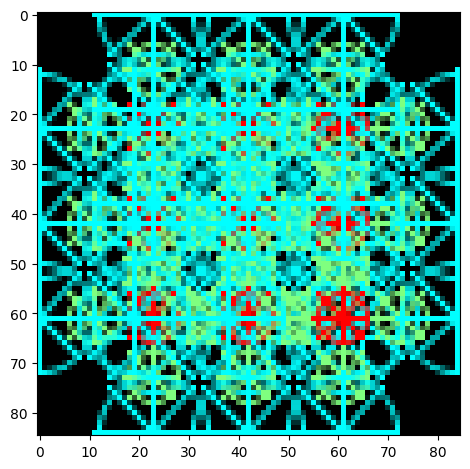

In [48]:
from skimage.feature import daisy
from skimage.io import imshow

# create an all black image
img = np.zeros((height,width))

# lets first visualize what the daisy descriptor looks like
features, img_desc = daisy(img,
                           step=19, 
                           radius=23, 
                           rings=2, 
                           histograms=4, 
                           orientations=8, 
                           visualize=True)
imshow(img_desc, cmap=plt.cm.gray, vmin = 0, vmax = 255)
plt.grid(False)

Next, DAISY was is used to perform feature extraction. Here a black image is used to show the distribution of DAISY feature points. I chose the step and radius to get a good coverage of the image while still being spread enough to hopefully capture general shapes and not specific details. These step and radius values also center the colleted points in the image making them more likely to extract important features. I chose 4 buckets for each histogram because the doodles are mostly black and white and capturing a wide array of greys in between would not contribute much to extracting features. In this data the direction of the lines being drawn is very important so I chose to use a high number at 8. I did some light testing with all these values and found that these values consistently produced the best results.

In [49]:
# create a function to take in the row of the matrix and return a new feature
def apply_daisy(row,shape):
    feat = daisy(row.reshape(shape), step=19, radius=23, 
                 rings=2, histograms=4, orientations=8, 
                 visualize=False)
    return feat.reshape((-1))

test_feature = apply_daisy(data[0],(height,width))
test_feature.shape

(648,)

Here a function is created to extract the DAISY features from each image. It is then tested to see the total number of features extracted from each image. The settings I chose give 648 features per image. This is both less than the 7225 pixels in the original image and the 2400 components from PCA. This makes sense as DAISY contains less information but ideally should be able to better capture the important features of the image.

In [50]:
daisy_features = np.apply_along_axis(apply_daisy, 1, data, (height,width))
print(daisy_features.shape)

(11999, 648)


Here DAISY is applied to all the doodles

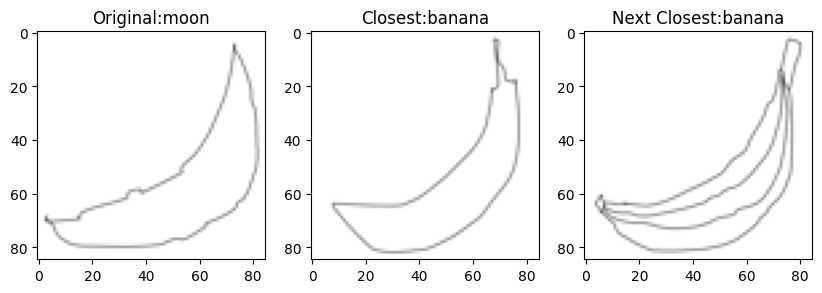

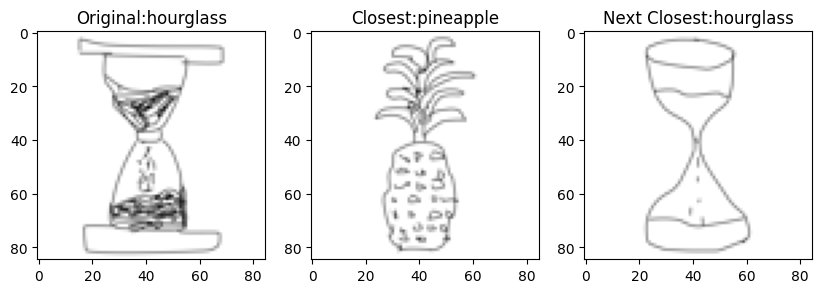

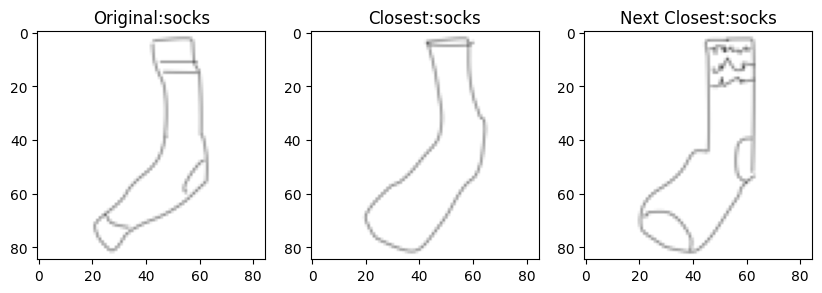

In [59]:
# get three random images and put a copy in a new array
num_doodles = 3
random_idx = np.random.randint(0, data.shape[0], size=num_doodles)
random_data = data[random_idx].copy()

random_data_daisy_features = np.apply_along_axis(apply_daisy, 1, random_data, (height,width))

# get the pairwise distance between the random images and all the other images
dist_matrix_DAISY = pairwise_distances(random_data_daisy_features, daisy_features)

# display the random images and their nearest neighbors
for i in range(num_doodles):
    closest_image(dist_matrix_DAISY, random_idx[i], i)

Like with PCA the pairwise distance is taken from a random sample of the DAISY features of the images and the two closest images are shown. Just from this DAISY shows a lot more promise for image classification on this dataset. Often the next closest image is from the same target category and when it isn't it is easy to see why the image was the closest.

In [52]:
X_pca_full_features = pca_full.transform(copy.deepcopy(data))
X_pca_features = pca.transform(copy.deepcopy(data))
X_rpca_features = rpca.transform(copy.deepcopy(data))

The PCA features are used here for a nearest neighbor classifier.

In [55]:
 
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split

# init a classifier for each feature space
knn_pca_full = KNeighborsClassifier(n_neighbors=1)
knn_pca = KNeighborsClassifier(n_neighbors=1)
knn_rpca = KNeighborsClassifier(n_neighbors=1)
knn_dsy = KNeighborsClassifier(n_neighbors=1)

# separate the data into train/test
# pca_train, pca_test, dsy_train, dsy_test, y_train, y_test = train_test_split(
#    X_pca_features,daisy_features, target, test_size=0.2, train_size=0.8)
pca_full_train, pca_full_test, pca_train, pca_test, rpca_train, rpca_test, dsy_train, dsy_test, y_train, y_test = train_test_split(
    X_pca_full_features, X_pca_features, X_rpca_features, daisy_features, target, test_size=0.2, train_size=0.8)

# fit each classifier
knn_pca_full.fit(pca_full_train,y_train)
acc_pca_full = accuracy_score(knn_pca_full.predict(pca_full_test),y_test)

knn_pca.fit(pca_train,y_train)
acc_pca = accuracy_score(knn_pca.predict(pca_test),y_test)

knn_rpca.fit(rpca_train,y_train)
acc_rpca = accuracy_score(knn_rpca.predict(rpca_test),y_test)

knn_dsy.fit(dsy_train,y_train)
acc_dsy = accuracy_score(knn_dsy.predict(dsy_test),y_test)

# report accuracy
print(f"Full PCA accuracy:       {100*acc_pca_full:.2f}%")
print(f"PCA accuracy:            {100*acc_pca:.2f}%")
print(f"Randomized PCA accuracy: {100*acc_rpca:.2f}%")
print(f"Daisy accuracy:          {100*acc_dsy:.2f}%")


Full PCA accuracy:       6.46%
PCA accuracy:            8.42%
Randomized PCA accuracy: 8.58%
Daisy accuracy:          38.25%


Here a nearest neighbor classifier has been used to measure the accuracy of all the types of PCA and the extracted DAISY features. This is done by splitting each type of features into 80% training data and 20% testing data. Because each category has 80 doodles and there are 12,000 doodles in total a random guess would have an accuracy of ~0.66%, this can be used as a baseline for the classifier.

Surprisingly, the worst classifier was for the full PCA features. This is likely due to the fact that the full PCA features are a perfect reconstruction of the original image and the classifier is getting caught up in small details instead of features of each category. PCA and rPCA both perform much better but still poorly. Like with the other metrics which one perform better is still based on the randomization of rPCA, but is now also dependent on the randomization of the training and testing data split.

DAISY performs by far the best. This is likely due to the fact that DAISY is able to capture the important features of each image like shapes and lines instead of patterns in individual pixels. This matches much closer to how the drawing were created, as humans build up drawing from larger features instead of plotting pixel by pixel. Even though DAISY outperformed the other methods, it's accuracy is still too low to be used for reliable classification. I think DAISY would also benefit greatly from a larger number of images in each category as DAISY still relies on a lot of similar features within each category.

Overall DAISY shows the most promise for classification but a different method would need to be used to get a reliable accuracy.

In [28]:
from skimage.feature import match_descriptors

def apply_daisy(row,shape): # no reshape in this function
    feat = daisy(row.reshape(shape), step=5, radius=5, 
                 rings=2, histograms=4, orientations=8, 
                 visualize=False)
    s = feat.shape # PxQxR
    #P = ceil((Height - radius*2) / step) 
    #Q = ceil((Width - radius*2) / step) 
    #R = (rings * histograms + 1) * orientations
    return feat.reshape((s[0]*s[1],s[2]))


reduced_data = data[-1200:]
reduced_target = target[-1200:]

daisy_features = np.apply_along_axis(apply_daisy, 1, reduced_data, (height,width))

print(daisy_features.shape)

matched_features = np.zeros((len(daisy_features),len(daisy_features)))

for idx, featuresX in enumerate(daisy_features):
    for idy, featuresY in enumerate(daisy_features):
        matches = match_descriptors(featuresX, featuresY, cross_check=True, max_ratio=0.8)
        matched_features[idx,idy] = matches.shape[0]
    # print percent done
    print(f"{100*idx/len(daisy_features):.2f}%", end="\r")



(1200, 225, 72)


In [33]:
knn = KNeighborsClassifier(n_neighbors=1)

f_train, f_test, t_train, t_test = train_test_split(matched_features,reduced_target, test_size=0.2, train_size=0.8)

knn.fit(f_train,t_train)
acc = accuracy_score(knn.predict(f_test),t_test)

print(f"Accuracy: {100*acc:.2f}%")

Accuracy: 62.08%


I was unable to do feature matching on the full dataset so i ran it on a reduced set and found promising results